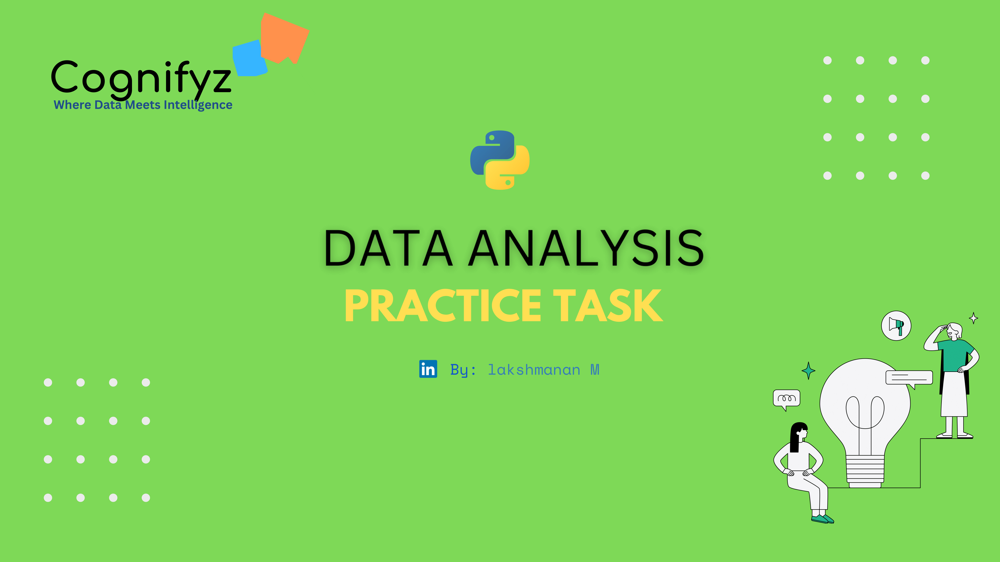

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
df=pd.read_csv("Dataset  (1).csv")
df.head(2)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591


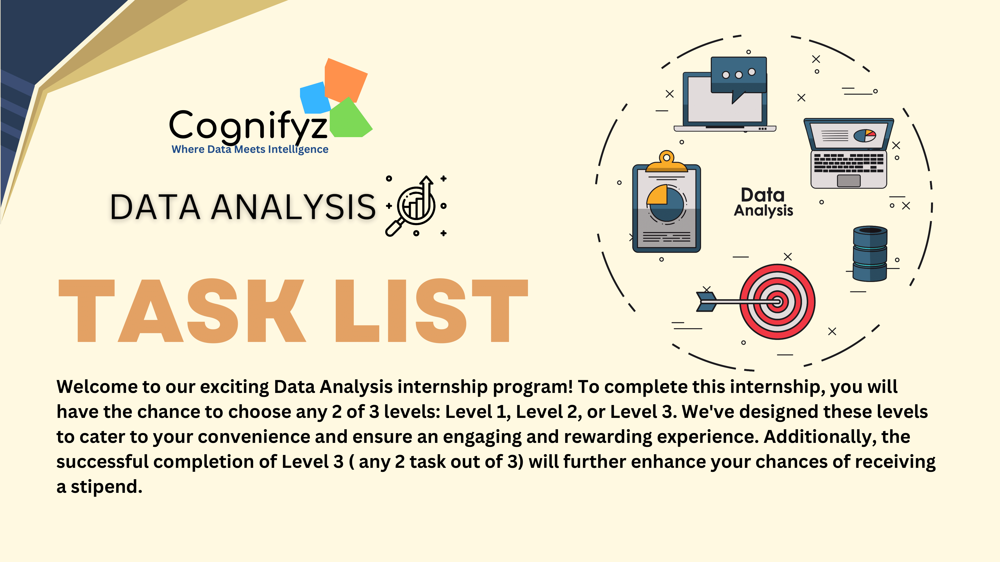

# **LEVEL 1**

**task1:Determine the top three most
common cuisines in the dataset.
Calculate the percentage of
restaurants that serve each of the top
cuisines**

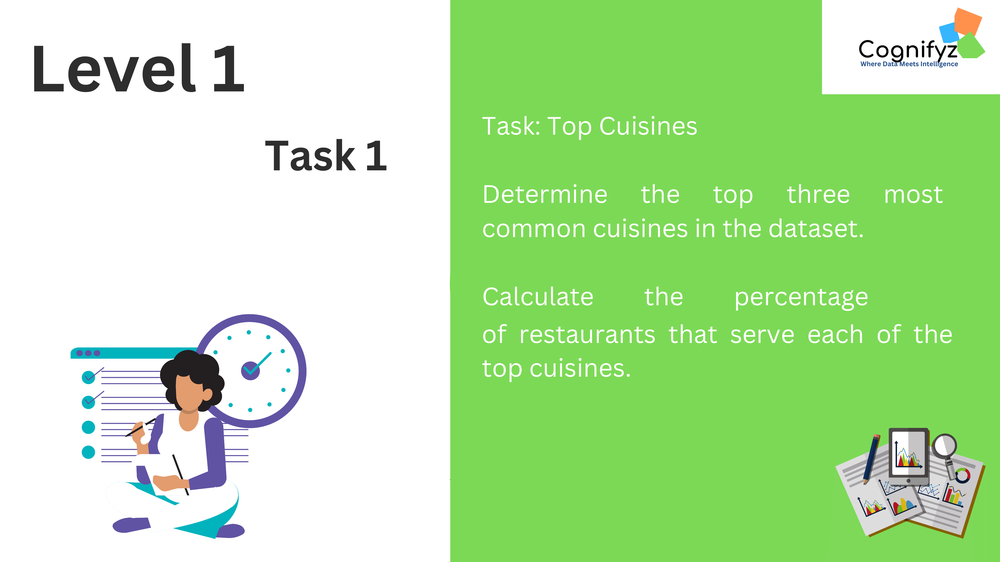

In [6]:
# top three most common cuisines
cuisine_counts = df['Cuisines'].value_counts()
cuisine_counts.head(3)

Cuisines
North Indian             936
North Indian, Chinese    511
Chinese                  354
Name: count, dtype: int64

In [7]:
total_restaurants = len(df)
total_restaurants

9551

In [8]:
# Calculate the percentage of restaurants that serve each of the top cuisines
percentages = (cuisine_counts / total_restaurants) * 100
percentages.head(3)

Cuisines
North Indian             9.800021
North Indian, Chinese    5.350225
Chinese                  3.706418
Name: count, dtype: float64

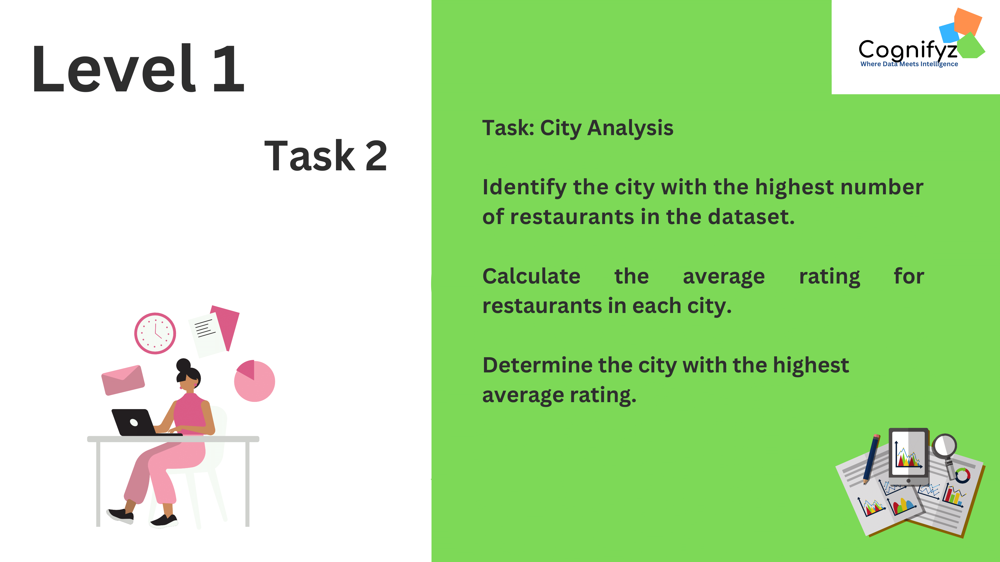

**Task 2: City Analysis
Identify the city with the highest number
of restaurants in the dataset.
Calculate the average rating for
restaurants in each city.
Determine the city with the highest
average rating.**

In [9]:
# City Analysis Identify the city with the highest number of restaurants
city_most_restaurants = df['City'].value_counts().head(1)
city_most_restaurants

City
New Delhi    5473
Name: count, dtype: int64

In [10]:
# Calculate the average rating for restaurants in each city
average_ratings = df.groupby('City')['Aggregate rating'].mean()
average_ratings

City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.555000
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
��stanbul          4.292857
Name: Aggregate rating, Length: 141, dtype: float64

In [11]:
# Determine the city with the highest average rating.
city_highest_rating = average_ratings.idxmax()
city_highest_rating

#OR
# city_highest_rating = average_ratings.head(1).index[0]
# city_highest_rating

'Inner City'

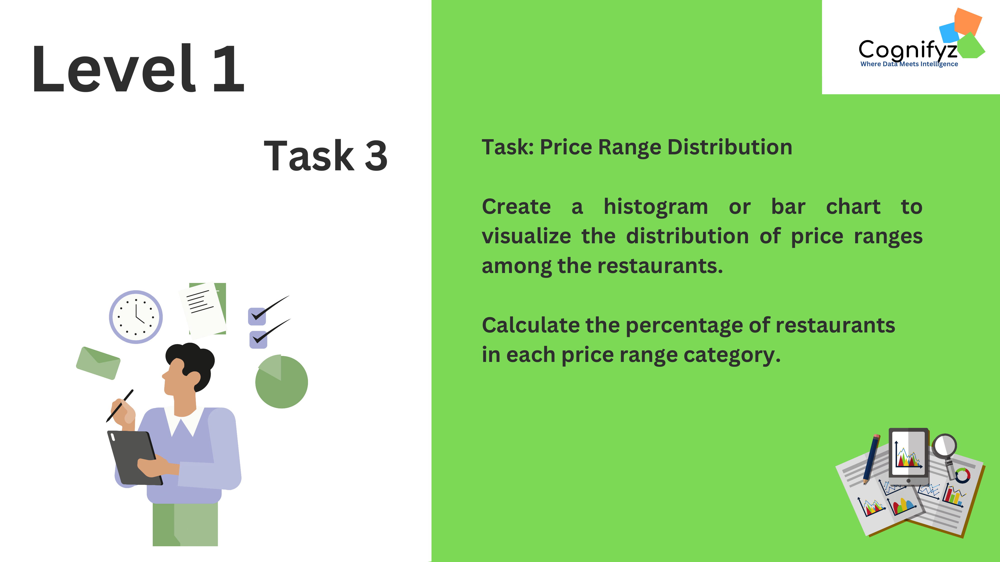

**Task 3: Price Range Distribution
Create a histogram or bar chart to
visualize the distribution of price ranges
among the restaurants.
Calculate the percentage of restaurants
in each price range category**

In [12]:
# Price Range
price_range_counts = df['Price range'].value_counts()
price_range_counts

Price range
1    4444
2    3113
3    1408
4     586
Name: count, dtype: int64

In [13]:
total_restaurants = len(df)
total_restaurants

9551

In [14]:
# Calculate the percentage of restaurants in each price range category
percentages = (price_range_counts / total_restaurants) * 100
percentages

Price range
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: count, dtype: float64

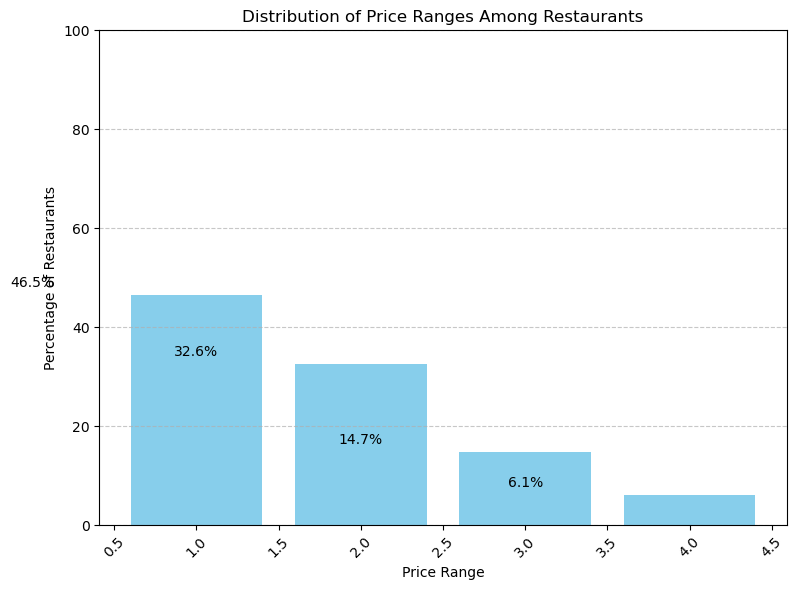

In [15]:
# Create a histogram or bar chart to visualize the distribution of price ranges among the restaurants.
plt.figure(figsize=(8, 6))
plt.bar(percentages.index, percentages.values, color='skyblue')
plt.xlabel('Price Range')
plt.ylabel('Percentage of Restaurants')
plt.title('Distribution of Price Ranges Among Restaurants')
plt.ylim(0, 100)  # Set the y-axis limit to 0-100% for percentage representation
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
for i, v in enumerate(percentages.values):
    plt.text(i, v + 1, f"{v:.1f}%", ha='center', va='bottom', fontsize=10)
plt.tight_layout()
plt.show()

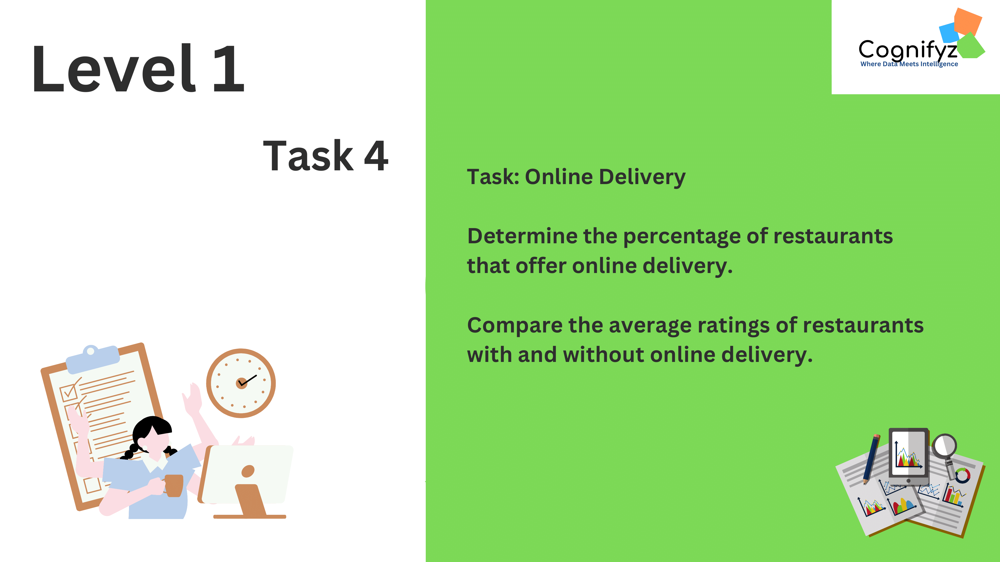

**Task4: Online Delivery
Determine the percentage of restaurants
that offer online delivery.
Compare the average ratings of restaurants
with and without online delivery.**

In [16]:
# Online Delivery Determine the percentage of restaurants that offer online delivery.
online_delivery_percentage = (df['Has Online delivery'].map({'Yes': True, 'No': False}).astype(int).sum() / len(df)) * 100
online_delivery_percentage

25.662234321013504

In [17]:
# Compare the average ratings of restaurants with and without online delivery.
average_rating_with_delivery = df[df['Has Online delivery'] == 'Yes']['Aggregate rating'].mean()
average_rating_without_delivery = df[df['Has Online delivery'] == 'No']['Aggregate rating'].mean()

print("Average rating with delivery:", average_rating_with_delivery)
print("Average rating without delivery:", average_rating_without_delivery)

Average rating with delivery: 3.2488372093023257
Average rating without delivery: 2.465295774647887


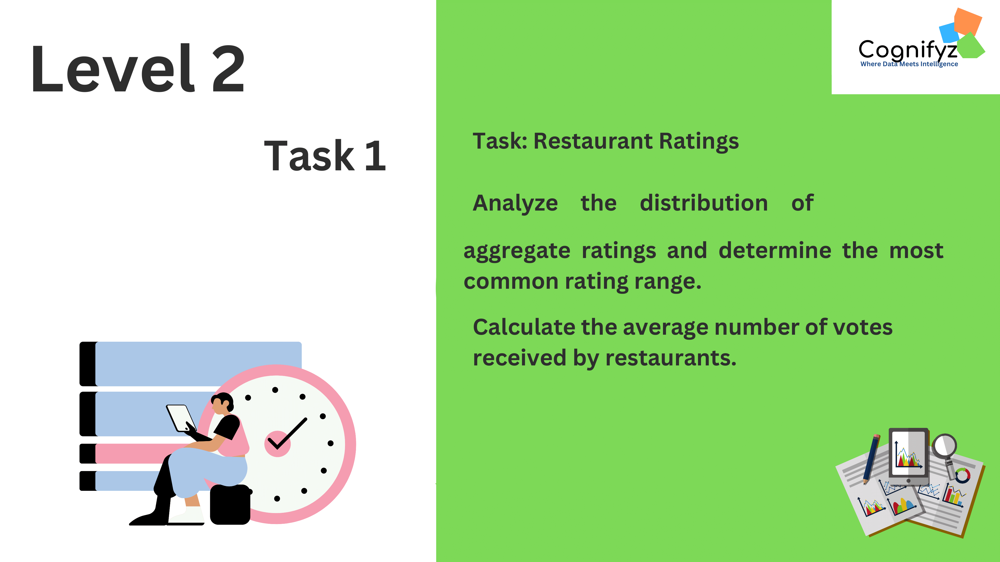

# **LEVEL 2**

**Task 1: Restaurant Ratings
Analyze the distribution of aggregate
ratings and determine the most common
rating range.
Calculate the average number of votes
received by restaurants.**

In [18]:
# Calculate the value counts of the 'Aggregate rating' column
rating_counts = df['Aggregate rating'].value_counts()
print(rating_counts)

Aggregate rating
0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: count, dtype: int64


In [19]:
# Calculate the average number of votes received by restaurants.
average_votes = df['Votes'].mean()
print("Average number of votes:", average_votes)

Average number of votes: 156.909747670401


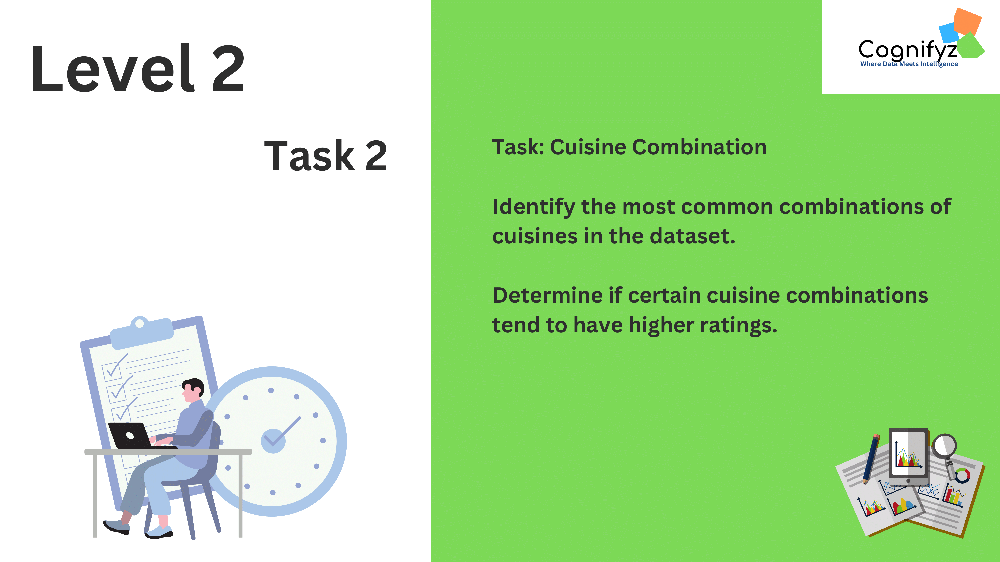

**Task 2: Cuisine Combination
Identify the most common combinations of
cuisines in the dataset.
Determine if certain cuisine combinations
tend to have higher ratings.**

In [20]:
# Cuisine Combination Identify the most common combinations of cuisines
cuisine_combinations = df.groupby('Restaurant ID')['Cuisines'].apply(lambda x: '|'.join(sorted(set(str(i)
for i in x)))).value_counts()
top_combinations = cuisine_combinations.head(5)
top_combinations

Cuisines
North Indian             936
North Indian, Chinese    511
Fast Food                354
Chinese                  354
North Indian, Mughlai    334
Name: count, dtype: int64

In [21]:
# To determine if certain combinations have higher ratings, you can calculate the average rating for each combination:
combination_ratings = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)
print(combination_ratings.head(10))

Cuisines
Italian, Deli               4.9
Hawaiian, Seafood           4.9
American, Sandwich, Tea     4.9
Continental, Indian         4.9
European, Asian, Indian     4.9
European, Contemporary      4.9
European, German            4.9
BBQ, Breakfast, Southern    4.9
American, Coffee and Tea    4.9
Sunda, Indonesian           4.9
Name: Aggregate rating, dtype: float64


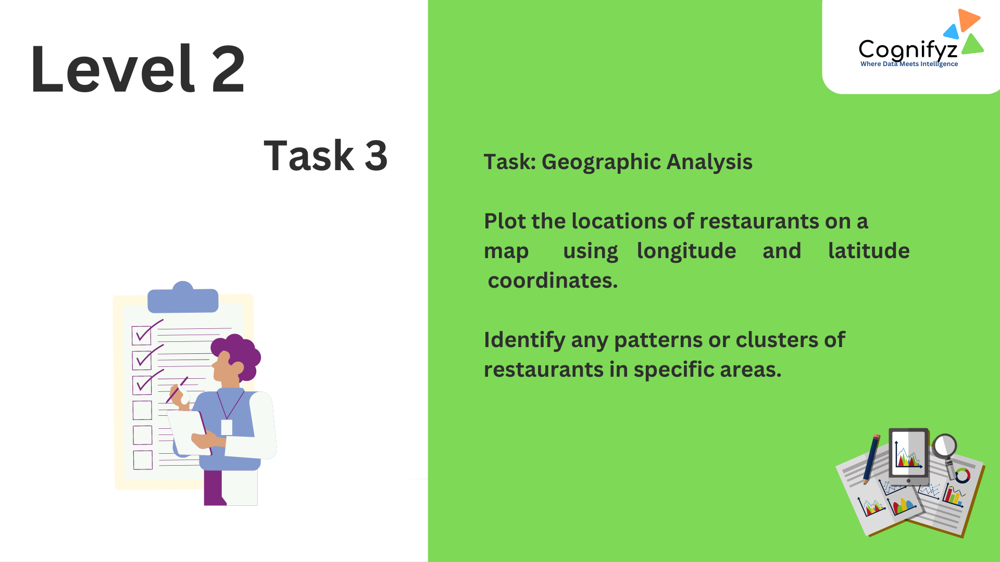

**Task 3: Geographic Analysis
Plot the locations of restaurants on a
map using longitude and latitude
coordinates.
Identify any patterns or clusters of
restaurants in specific areas.**

In [22]:
 !pip install folium==0.14.0

   ---------------------------------------- 0.0/102.3 kB ? eta -:--:--
   ---- ----------------------------------- 10.2/102.3 kB ? eta -:--:--
   --------------- ----------------------- 41.0/102.3 kB 393.8 kB/s eta 0:00:01
   -------------------------------------- 102.3/102.3 kB 736.3 kB/s eta 0:00:00


In [6]:
import folium

# Create a map centered around the mean latitude and longitude
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
my_map = folium.Map(location=map_center, zoom_start=10)

# Add markers for each restaurant
for _, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(my_map)

# Display the map
my_map

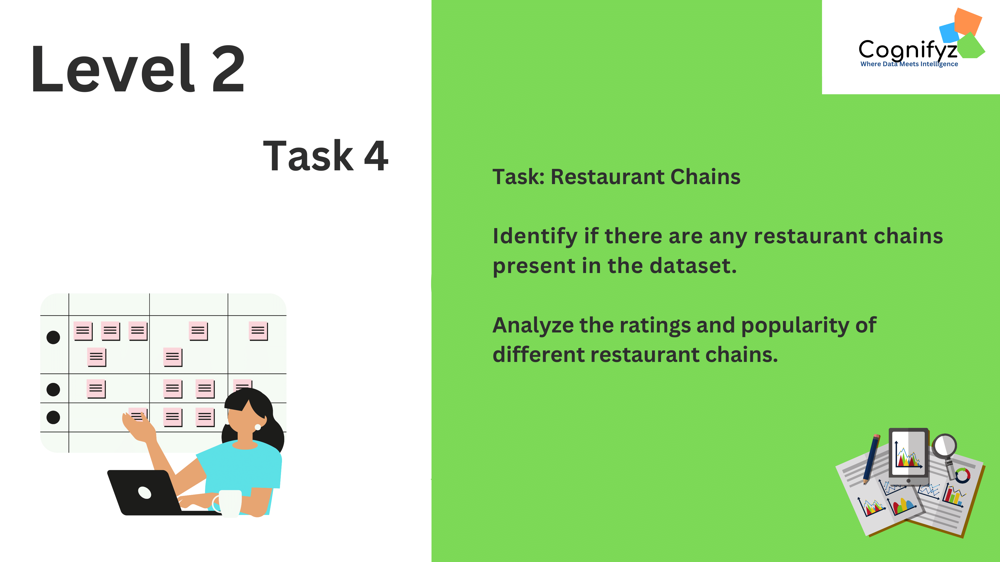

**Task 4: Restaurant Chains
Identify if there are any restaurant chains
present in the dataset.
Analyze the ratings and popularity of
different restaurant chains.**

In [24]:
# Group the DataFrame by 'Restaurant Name' and count the occurrences
restaurant_counts = df['Restaurant Name'].value_counts().head(10)
restaurant_counts

Restaurant Name
Cafe Coffee Day     83
Domino's Pizza      79
Subway              63
Green Chick Chop    51
McDonald's          48
Keventers           34
Pizza Hut           30
Giani               29
Baskin Robbins      28
Barbeque Nation     26
Name: count, dtype: int64

In [25]:
# Filter for restaurants with counts greater than 1, indicating chains
chains = restaurant_counts[restaurant_counts > 1]
print("Restaurant chains and their counts:")
print(chains)

Restaurant chains and their counts:
Restaurant Name
Cafe Coffee Day     83
Domino's Pizza      79
Subway              63
Green Chick Chop    51
McDonald's          48
Keventers           34
Pizza Hut           30
Giani               29
Baskin Robbins      28
Barbeque Nation     26
Name: count, dtype: int64


In [26]:
# Analyze ratings and popularity (example using average rating)
chain_ratings = df[df['Restaurant Name'].isin(chains.index)].groupby('Restaurant Name')['Aggregate rating'].mean()
print("\nAverage ratings of restaurant chains:")
print(chain_ratings)


Average ratings of restaurant chains:
Restaurant Name
Barbeque Nation     4.353846
Baskin Robbins      1.860714
Cafe Coffee Day     2.419277
Domino's Pizza      2.740506
Giani               2.689655
Green Chick Chop    2.672549
Keventers           2.870588
McDonald's          3.339583
Pizza Hut           3.320000
Subway              2.907937
Name: Aggregate rating, dtype: float64


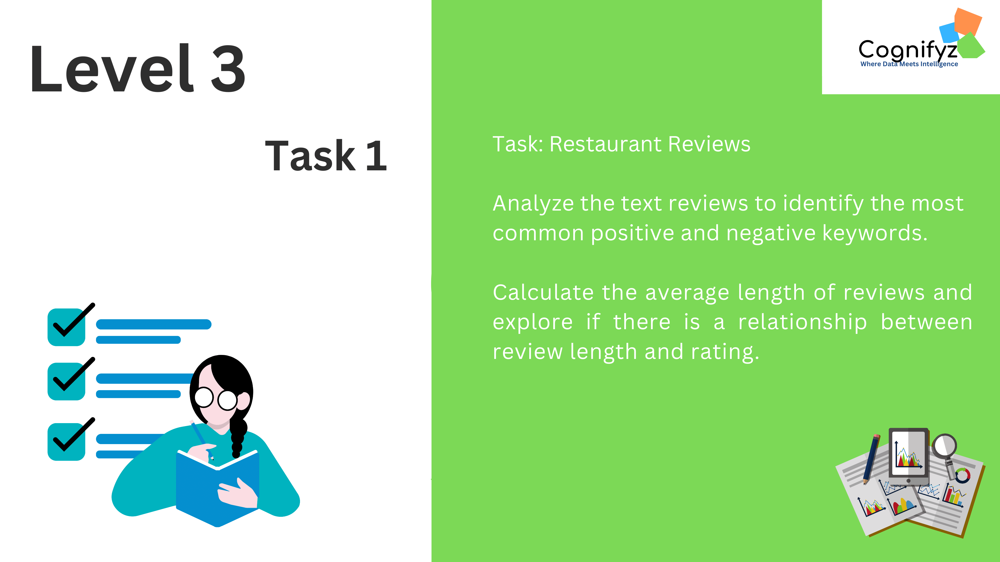

# **LEVEL 3**

**Task 1: Restaurant Reviews
Analyze the text reviews to identify the most
common positive and negative keywords.
Calculate the average length of reviews and
explore if there is a relationship between
review length and rating.**

In [27]:
!pip install nltk==3.10 --force-reinstall

ERROR: Ignored the following yanked versions: 3.6.4
ERROR: Could not find a version that satisfies the requirement nltk==3.10 (from versions: 2.0b8.macosx-10.5-i386, 2.0.1rc1.macosx-10.6-x86_64, 2.0.1rc2-git, 2.0b4, 2.0b5, 2.0b6, 2.0b7, 2.0b8, 2.0b9, 2.0.1rc1, 2.0.1rc3, 2.0.1rc4, 2.0.1, 2.0.2, 2.0.3, 2.0.4, 2.0.5, 3.0.0b1, 3.0.0b2, 3.0.0, 3.0.1, 3.0.2, 3.0.3, 3.0.4, 3.0.5, 3.1, 3.2, 3.2.1, 3.2.2, 3.2.3, 3.2.4, 3.2.5, 3.3.0, 3.4, 3.4.1, 3.4.2, 3.4.3, 3.4.4, 3.4.5, 3.5b1, 3.5, 3.6, 3.6.1, 3.6.2, 3.6.3, 3.6.5, 3.6.6, 3.6.7, 3.7, 3.8, 3.8.1)
ERROR: No matching distribution found for nltk==3.10


In [28]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import Counter

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\think\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\think\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


In [29]:
def preprocess_reviews(reviews):
    stop_words = set(stopwords.words('english'))
    processed_reviews = []
    for review in reviews:
        # Tokenize the review
        tokens = word_tokenize(review.lower())
        # Remove stop words and punctuation
        processed_tokens = [token for token in tokens if token.isalnum() and token not in stop_words]
        processed_reviews.append(processed_tokens)
    return processed_reviews


In [30]:
positive_words = ['good', 'great', 'delicious', 'amazing', 'excellent']
negative_words = ['bad', 'terrible', 'awful', 'horrible', 'disappointing']

In [31]:
positive_counts = Counter()
negative_counts = Counter()

processed_reviews = preprocess_reviews(df['Rating text'])

for review in processed_reviews:
    for word in review:
        if word in positive_words:
            positive_counts[word] += 1
        elif word in negative_words:
            negative_counts[word] += 1

print("Most common positive keywords:", positive_counts.most_common(5))
print("Most common negative keywords:", negative_counts.most_common(5))

Most common positive keywords: [('good', 3179), ('excellent', 301)]
Most common negative keywords: []


In [32]:
review_lengths = [len(word_tokenize(review)) for review in df['Rating text']]
average_length = sum(review_lengths) / len(review_lengths)
print("Average review length:", average_length)

Average review length: 1.3378703800649148


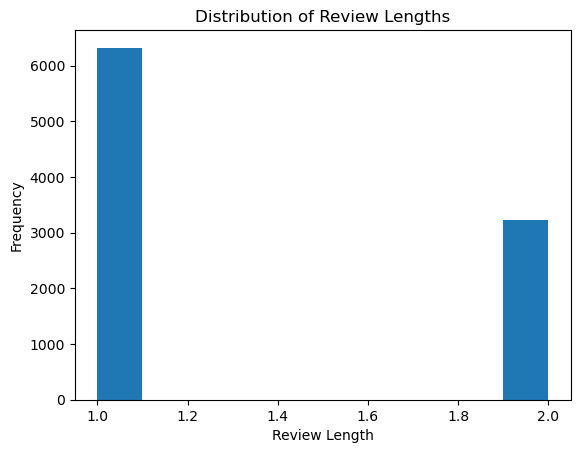

In [33]:
plt.hist(review_lengths, bins=10)
plt.xlabel('Review Length')
plt.ylabel('Frequency')
plt.title('Distribution of Review Lengths')
plt.show()

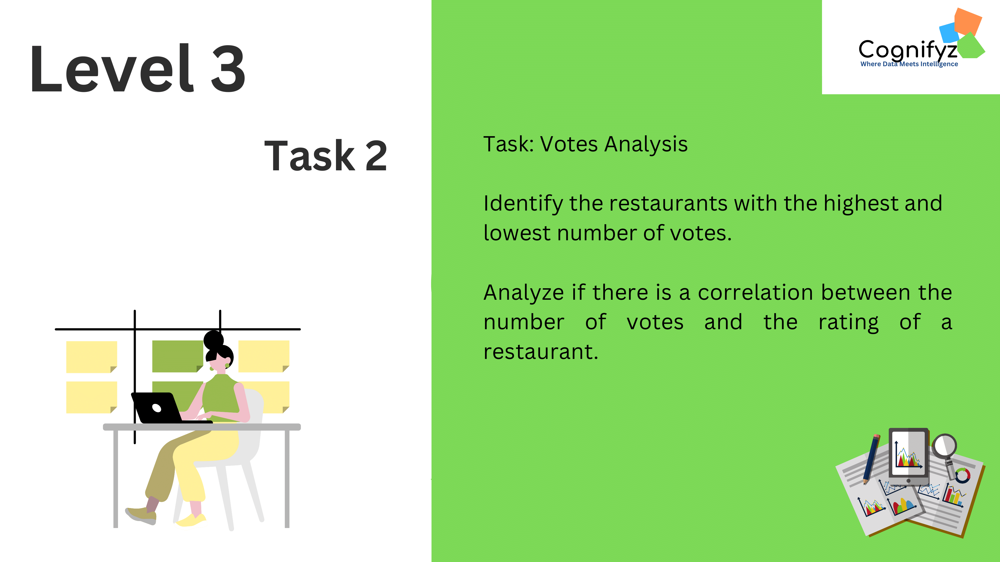

**Task 2: Votes Analysis
Identify the restaurants with the highest and
lowest number of votes.
Analyze if there is a correlation between the
number of votes and the rating of a
restaurant.**

In [35]:
# Sort by votes in descending order to find restaurants with highest votes
highest_votes_restaurants = df.sort_values('Votes', ascending=False).head()
print(highest_votes_restaurants[['Restaurant Name', 'Votes']])

# Sort by votes in ascending order to find restaurants with lowest votes
lowest_votes_restaurants = df.sort_values('Votes').head()
print(lowest_votes_restaurants[['Restaurant Name', 'Votes']])

                Restaurant Name  Votes
728                        Toit  10934
735                    Truffles   9667
3994           Hauz Khas Social   7931
2412                  Peter Cat   7574
739   AB's - Absolute Barbecues   6907
                 Restaurant Name  Votes
5799         Khalsa Eating Point      0
7411   Radha Swami Chaat Bhandar      0
7414  Ram Ram Ji Kachori Bhandar      0
7415          Rana's Food Corner      0
7416         Sanjay Chicken Shop      0


In [36]:
correlation = df['Votes'].corr(df['Aggregate rating'])
print("Correlation between votes and rating:", correlation)

Correlation between votes and rating: 0.31369058419541135


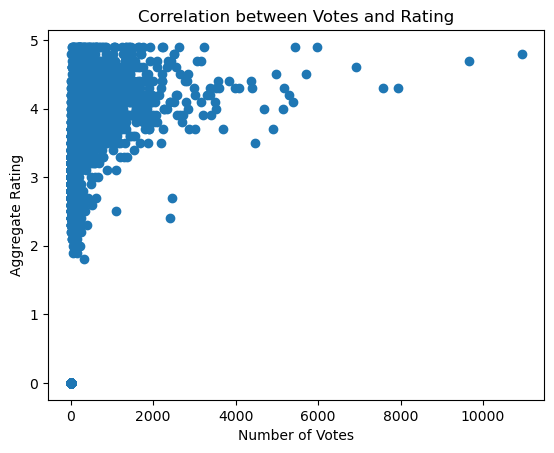

In [37]:
plt.scatter(df['Votes'], df['Aggregate rating'])
plt.xlabel('Number of Votes')
plt.ylabel('Aggregate Rating')
plt.title('Correlation between Votes and Rating')
plt.show()

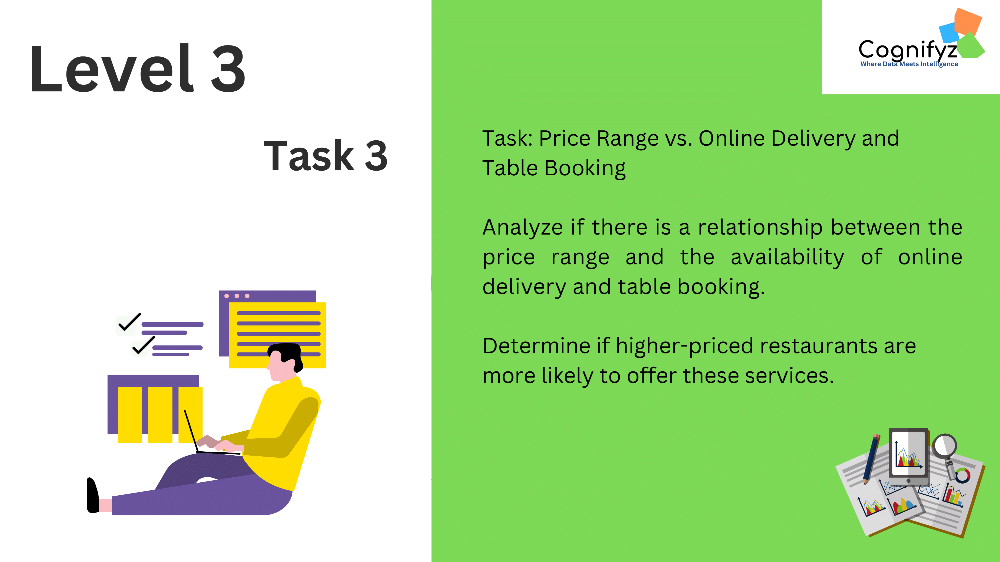

**Task 3: Price Range vs. Online Delivery and
Table Booking
Analyze if there is a relationship between the
price range and the availability of online
delivery and table booking.
Determine if higher-priced restaurants are
more likely to offer these services.**

In [38]:
pd.crosstab(df['Price range'], df['Has Table booking'])

Has Table booking,No,Yes
Price range,,
1,4443,1
2,2874,239
3,764,644
4,312,274


In [39]:
delivery_by_price = df.groupby('Price range')['Has Online delivery'].value_counts(normalize=True).unstack()
booking_by_price = df.groupby('Price range')['Has Table booking'].value_counts(normalize=True).unstack()

print(delivery_by_price)
print(booking_by_price)

Has Online delivery        No       Yes
Price range                            
1                    0.842259  0.157741
2                    0.586894  0.413106
3                    0.708097  0.291903
4                    0.909556  0.090444
Has Table booking        No       Yes
Price range                          
1                  0.999775  0.000225
2                  0.923225  0.076775
3                  0.542614  0.457386
4                  0.532423  0.467577


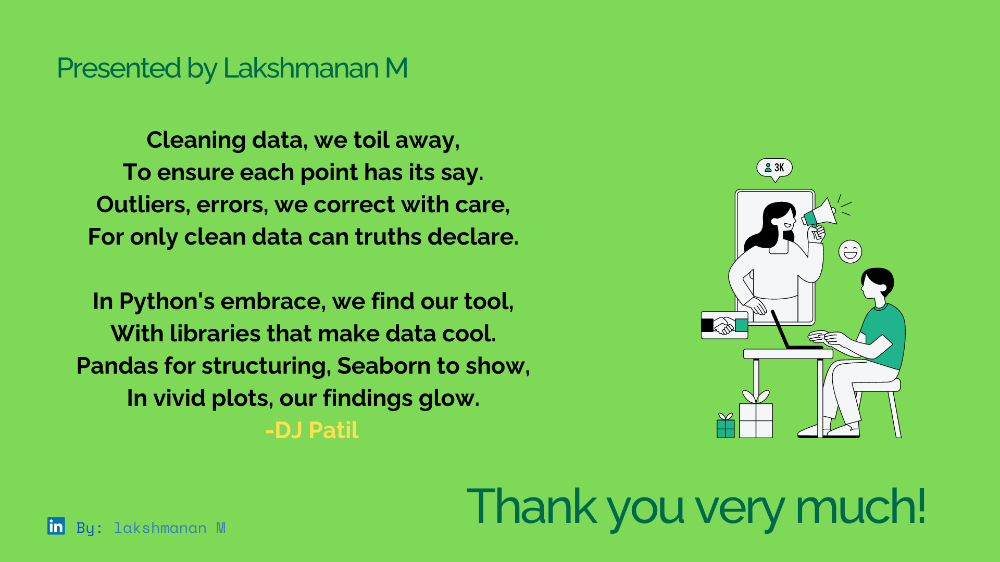